In [1]:
from google.colab import files

uploaded = files.upload()


Saving all.zip to all.zip


In [2]:
import zipfile

with zipfile.ZipFile("all.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/")


In [3]:
import os

print(os.listdir("/content/all"))
# Powinno wypisać: ['images', 'manual1', 'mask']


['images', 'manual1', 'mask']


In [3]:
from glob import glob
import os

# Wyszukujemy obrazy RGB (.jpg i .JPG)
image_paths = glob("/content/all/images/*.jpg") + glob("/content/all/images/*.JPG")
image_paths = sorted(image_paths)

# Wyszukujemy maski naczyń (.tif)
mask_paths = glob("/content/all/manual1/*.tif")
mask_paths = sorted(mask_paths)

# Wyszukujemy fov naczyń (.tif)
fov_paths = glob("/content/all/mask/*.tif")
fov_paths = sorted(mask_paths)

In [4]:
def match_paths_debug(name_list, image_paths, mask_paths, fov_paths):
    matched = []
    for name in name_list:
        base = os.path.splitext(name)[0]
        img = [p for p in image_paths if base in os.path.basename(p)]
        msk = [p for p in mask_paths if base in os.path.basename(p)]
        fov = [p for p in fov_paths if base in os.path.basename(p)]

        if img and msk and fov:
            matched.append((img[0], msk[0], fov[0]))
    return matched

In [5]:
test_names  = ["11_g.jpg", "11_h.jpg", "11_dr.JPG","12_g.jpg", "12_h.jpg", "12_dr.JPG"]
import os

In [6]:
test_triplets = match_paths_debug(test_names,image_paths,mask_paths, fov_paths)

In [10]:
test_triplets

[('/content/all/images/11_g.jpg',
  '/content/all/manual1/11_g.tif',
  '/content/all/manual1/11_g.tif'),
 ('/content/all/images/11_h.jpg',
  '/content/all/manual1/11_h.tif',
  '/content/all/manual1/11_h.tif'),
 ('/content/all/images/11_dr.JPG',
  '/content/all/manual1/11_dr.tif',
  '/content/all/manual1/11_dr.tif'),
 ('/content/all/images/12_g.jpg',
  '/content/all/manual1/12_g.tif',
  '/content/all/manual1/12_g.tif'),
 ('/content/all/images/12_h.jpg',
  '/content/all/manual1/12_h.tif',
  '/content/all/manual1/12_h.tif'),
 ('/content/all/images/12_dr.JPG',
  '/content/all/manual1/12_dr.tif',
  '/content/all/manual1/12_dr.tif')]

In [10]:
from sklearn.metrics import confusion_matrix
def compute_metrics_per_image(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 1
    harmonic_mean = 2 * (sensitivity * specificity) / (sensitivity + specificity + 1e-6)
    arithmetic_mean = (sensitivity + specificity) / 2
    return {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'harmonic_mean': harmonic_mean,
        'arithmetic_mean': arithmetic_mean,
        'TP': tp,
        'TN': tn,
        'FP': fp,
        'FN': fn
    }

In [11]:
from skimage.morphology import remove_small_objects, binary_closing, disk
from skimage.filters import frangi
from skimage import exposure
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
def evaluate_retinal_segmentation(triplets, min_size=20):
    results = []
    for img_path, msk_path, fov_path in triplets:
        # Wczytywanie danych
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(msk_path, cv2.IMREAD_GRAYSCALE)
        fov = cv2.imread(fov_path, cv2.IMREAD_GRAYSCALE)


        mask = (mask >0).astype(int)
        fov = fov > 0

        # Kanał zielony
        green = image[:, :, 1]

        # Dylacja + denoising + equalizacja histogramu
        kernel = np.ones((5, 5), np.uint8)
        dilated = cv2.dilate(green, kernel, iterations=1)
        denoised = cv2.fastNlMeansDenoising(dilated, None, 10, 5, 21)
        enhanced = exposure.equalize_hist(denoised)

        # Filtr Frangiego
        frangi_resp = frangi(enhanced, scale_step=2)
        frangi_norm = (frangi_resp - frangi_resp.min()) / (frangi_resp.max() - frangi_resp.min())

        # Ręczne progowanie (ostatecznie tak wyszlo lepiej)
        binary = (frangi_norm > 0.0001).astype(np.uint8)

        # Finalne progowanie OpenCV
        binary = (binary * 255).astype(np.uint8)
        _, thresholded = cv2.threshold(binary, 100, 255, cv2.THRESH_BINARY)

        # Postprocessing
        post = remove_small_objects(thresholded.astype(bool), min_size=min_size)
        post = binary_closing(post, footprint=disk(1))
        final_mask = post.astype(np.uint8)

        # Maska FOV – odrzucamy wszystko poza siatkówką

        final_mask = final_mask * fov.astype(np.uint8)
        mask = mask * fov.astype(np.uint8)


        # Konwersja do płaskich wektorów
        y_pred = final_mask[fov].flatten()
        y_true = mask[fov].flatten()

        # Oblicz metryki
        y_pred = final_mask.flatten()
        y_true = mask.flatten()
        print("unique in y_pred:", np.unique(y_pred))
        print("unique in y_true:", np.unique(y_true))

        metrics = compute_metrics_per_image(y_true, y_pred)
        metrics["image"] = os.path.basename(img_path)
        results.append(metrics)
        print(metrics)

        # Mapa TP/FP/FN
        tp = (final_mask == 1) & (mask == 1)
        fp = (final_mask == 1) & (mask == 0)
        fn = (final_mask == 0) & (mask == 1)

        vis = np.zeros((*mask.shape, 3), dtype=np.uint8)
        vis[tp] = [0, 255, 0]      # TP - zielony
        vis[fp] = [255, 0, 0]      # FP - czerwony
        vis[fn] = [0, 0, 255]      # FN - niebieski

        # Wizualizacja
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        axs[0].imshow(image)
        axs[0].set_title("Obraz źródłowy")

        axs[1].imshow(mask, cmap='gray')
        axs[1].set_title("Maska ekspercka")

        axs[2].imshow(final_mask, cmap='gray')
        axs[2].set_title("Maska przewidziana")

        axs[3].imshow(vis)
        axs[3].set_title("TP (zielony), FP (czerwony), FN (niebieski)")

        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.suptitle(f"Obraz: {os.path.basename(img_path)}", fontsize=16)
        plt.show()

    df = pd.DataFrame(results)
    from IPython.display import display
    display(df.round(4))
    return df

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9789115765934822), 'sensitivity': np.float64(0.7241202954164423), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.8399876474369967), 'arithmetic_mean': np.float64(0.8620601477082211), 'TP': np.int64(453077), 'TN': np.int64(7559651), 'FP': np.int64(0), 'FN': np.int64(172616), 'image': '11_g.jpg'}


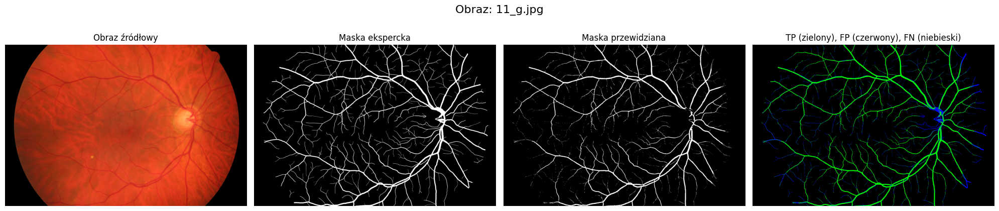

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9822843120582349), 'sensitivity': np.float64(0.8105336739160259), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.8953528320591767), 'arithmetic_mean': np.float64(0.905266836958013), 'TP': np.int64(620346), 'TN': np.int64(7419989), 'FP': np.int64(0), 'FN': np.int64(145009), 'image': '11_h.jpg'}


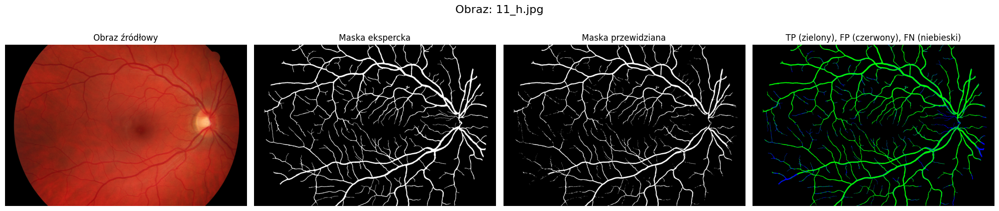

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9822893210108213), 'sensitivity': np.float64(0.7907919478971392), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.8831751865292261), 'arithmetic_mean': np.float64(0.8953959739485696), 'TP': np.int64(547969), 'TN': np.int64(7492407), 'FP': np.int64(0), 'FN': np.int64(144968), 'image': '11_dr.JPG'}


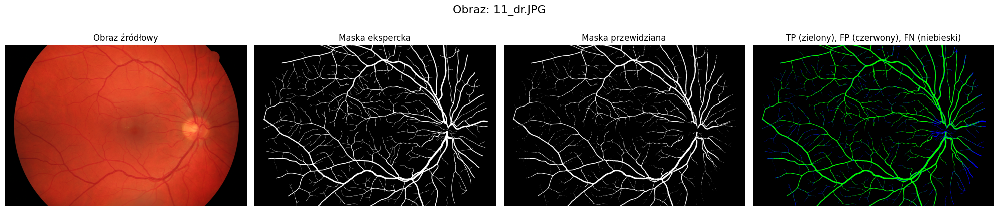

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9871535026505911), 'sensitivity': np.float64(0.844545728714534), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.9157216952731781), 'arithmetic_mean': np.float64(0.9222728643572671), 'TP': np.int64(571271), 'TN': np.int64(7508920), 'FP': np.int64(0), 'FN': np.int64(105153), 'image': '12_g.jpg'}


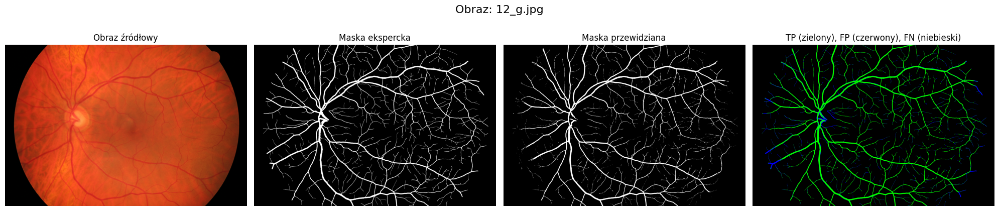

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9845416393006818), 'sensitivity': np.float64(0.852749055912114), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.920522499180067), 'arithmetic_mean': np.float64(0.926374527956057), 'TP': np.int64(732763), 'TN': np.int64(7326049), 'FP': np.int64(0), 'FN': np.int64(126532), 'image': '12_h.jpg'}


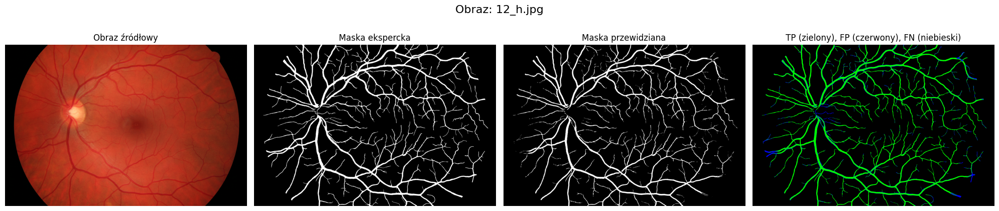

unique in y_pred: [0 1]
unique in y_true: [0 1]
{'accuracy': np.float64(0.9886042663570401), 'sensitivity': np.float64(0.8324519869809816), 'specificity': np.float64(1.0), 'harmonic_mean': np.float64(0.9085657235359362), 'arithmetic_mean': np.float64(0.9162259934904908), 'TP': np.int64(463446), 'TN': np.int64(7628620), 'FP': np.int64(0), 'FN': np.int64(93278), 'image': '12_dr.JPG'}


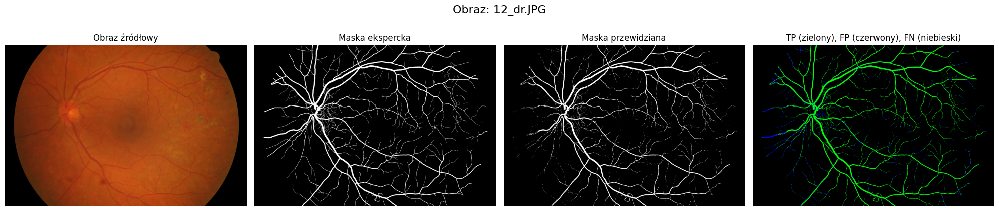

,accuracy,sensitivity,specificity,harmonic_mean,arithmetic_mean,TP,TN,FP,FN,image
0,0.9789,0.7241,1.0,0.8400,0.8621,453077,7559651,0,172616,11_g.jpg
1,0.9823,0.8105,1.0,0.8954,0.9053,620346,7419989,0,145009,11_h.jpg
2,0.9823,0.7908,1.0,0.8832,0.8954,547969,7492407,0,144968,11_dr.JPG
3,0.9872,0.8445,1.0,0.9157,0.9223,571271,7508920,0,105153,12_g.jpg
4,0.9845,0.8527,1.0,0.9205,0.9264,732763,7326049,0,126532,12_h.jpg
5,0.9886,0.8325,1.0,0.9086,0.9162,463446,7628620,0,93278,12_dr.JPG


In [12]:
results = evaluate_retinal_segmentation(test_triplets)

In [ ]:
test_triplets

[]

In [ ]:
# UCzenie na 4.0

In [ ]:
def get_segments(image, patch_size=15):
    segments = []
    h, w = image.shape[:2]
    h = h - h % patch_size
    w = w - w % patch_size
    for y in range(0, h, patch_size):
        for x in range(0, w, patch_size):
            segment = image[y:y + patch_size, x:x + patch_size]
            segments.append(segment)
    return segments

def get_segment_stats(segment):
    gray_segment = cv2.cvtColor(segment, cv2.COLOR_BGR2GRAY)
    moments = cv2.moments(gray_segment)
    hu = cv2.HuMoments(moments).flatten()
    hu = -np.sign(hu) * np.log10(np.abs(hu) + 1e-10)

    r_var = np.var(segment[:, :, 2])
    g_var = np.var(segment[:, :, 1])
    b_var = np.var(segment[:, :, 0])

    return np.concatenate((hu, [r_var, g_var, b_var]))

def prepare_data(image_path, mask_path, patch_size=15):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    segments = get_segments(image, patch_size)
    mask_segments = get_segments(mask, patch_size)

    features = []
    labels = []

    for seg, msk in zip(segments, mask_segments):
        label = 1 if msk[patch_size//2, patch_size//2] > 0 else 0
        feat = get_segment_stats(seg)
        features.append(feat)
        labels.append(label)

    return np.array(features, dtype=np.float32), np.array(labels, dtype=np.uint8)

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
import pandas as pd

# Trening: obraz 01
X, y = prepare_data("/content/all/images/01_dr.JPG", "/content/all/manual1/01_dr.tif", patch_size=15)

rus = RandomUnderSampler(random_state=42)
X_bal, y_bal = rus.fit_resample(X, y)

clf = DecisionTreeClassifier(max_depth=30, min_samples_leaf=5, random_state=42)

clf.fit(X_bal, y_bal)

DecisionTreeClassifier(max_depth=30, min_samples_leaf=5, random_state=42)

In [ ]:
def classify_segments_with_threshold(image_path, clf, threshold=0.01, patch_size=15):
    image = cv2.imread(image_path)
    h, w = image.shape[:2]
    h = h - h % patch_size
    w = w - w % patch_size
    image = image[:h, :w]

    mask = np.zeros((h, w), dtype=np.uint8)
    vessel_count = 0

    for y in range(0, h, patch_size):
        for x in range(0, w, patch_size):
            patch = image[y:y + patch_size, x:x + patch_size]
            features = get_segment_stats(patch).reshape(1, -1)
            proba = clf.predict_proba(features)[0][1]
            if proba > threshold:
                mask[y:y + patch_size, x:x + patch_size] = 255
                vessel_count += 1

    print("Segmentów wykrytych jako naczynia:", vessel_count)
    return mask


In [ ]:
def visualize_classification_result(test_image_path, predicted_mask, expert_mask_path):
    original = cv2.imread(test_image_path)
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    expert_mask = cv2.imread(expert_mask_path, cv2.IMREAD_GRAYSCALE) > 0
    predicted = predicted_mask > 0

    tp = np.logical_and(predicted, expert_mask)
    fp = np.logical_and(predicted, ~expert_mask)
    fn = np.logical_and(~predicted, expert_mask)

    diff_map = np.zeros((*predicted.shape, 3), dtype=np.uint8)
    diff_map[tp] = [0, 255, 0]
    diff_map[fp] = [255, 0, 0]
    diff_map[fn] = [0, 0, 255]

    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    axs[0].imshow(original)
    axs[0].set_title("Obraz źródłowy")

    axs[1].imshow(expert_mask, cmap='gray')
    axs[1].set_title("Maska ekspercka")

    axs[2].imshow(predicted, cmap='gray')
    axs[2].set_title("Maska RF (proba > threshold)")

    axs[3].imshow(diff_map)
    axs[3].set_title("TP/FP/FN (zielony/czerwony/niebieski)")

    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Predykcja na obrazie: 11_g
Segmentów wykrytych jako naczynia: 7849


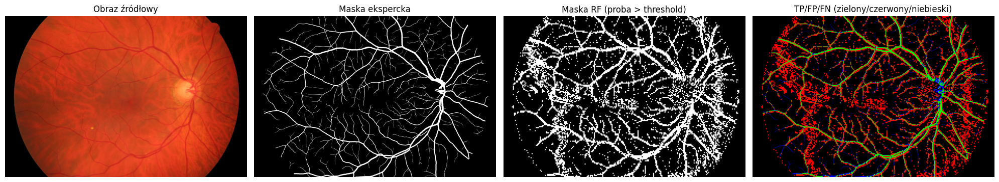

# Predykcja na obrazie: 11_h
Segmentów wykrytych jako naczynia: 11374


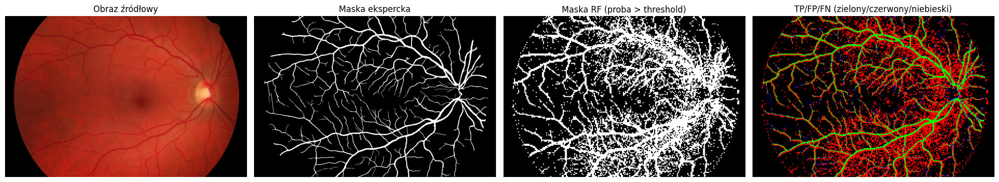

# Predykcja na obrazie: 11_dr
Segmentów wykrytych jako naczynia: 9518


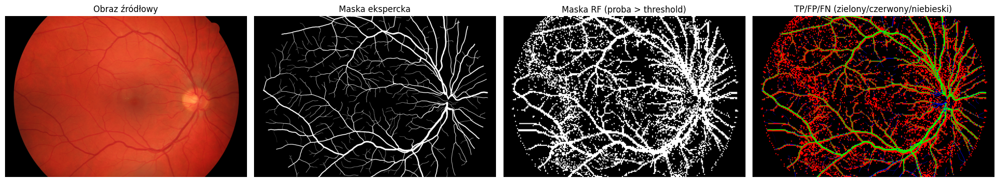

# Predykcja na obrazie: 12_g
Segmentów wykrytych jako naczynia: 8467


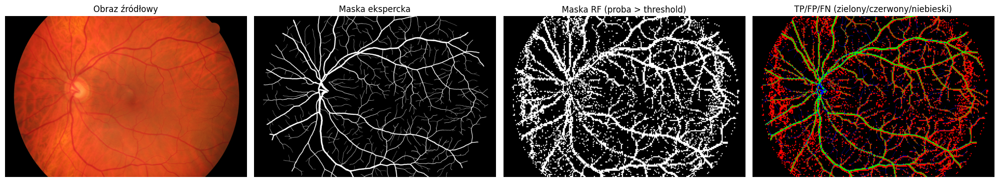

# Predykcja na obrazie: 12_h
Segmentów wykrytych jako naczynia: 12810


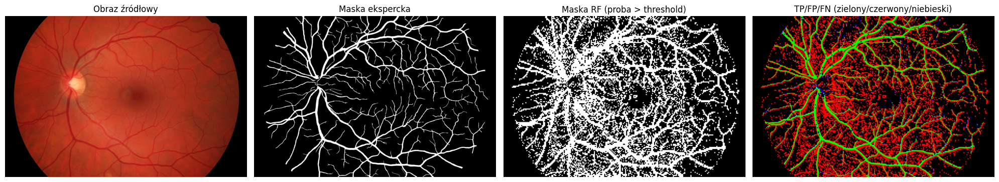

# Predykcja na obrazie: 12_dr
Segmentów wykrytych jako naczynia: 9097


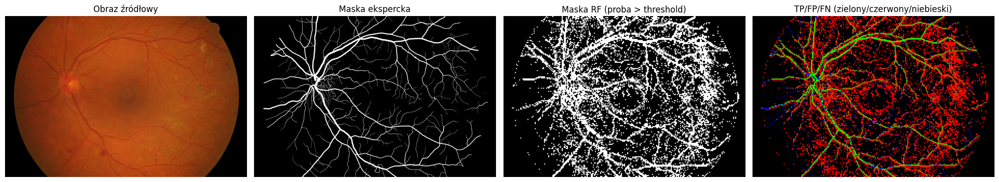

   accuracy  sensitivity  specificity  harmonic_mean  arithmetic_mean      TP  \
0  0.814826     0.710321     0.823476       0.762724         0.766898  444443   
1  0.750783     0.851661     0.740378       0.792129         0.796019  651823   
2  0.782440     0.772744     0.783337       0.778004         0.778040  535463   
3  0.802400     0.722965     0.809555       0.763813         0.766260  489031   
4  0.723042     0.869954     0.705810       0.779332         0.787882  747547   
5  0.777786     0.717668     0.782174       0.748533         0.749921  399543   

        TN       FP      FN  image  
0  6225188  1334463  181250   11_g  
1  5493593  1926396  113532   11_h  
2  5869078  1623329  157474  11_dr  
3  6078886  1430034  187393   12_g  
4  5170798  2155251  111748   12_h  
5  5966905  1661715  157181  12_dr  


In [ ]:
# Parametry
patch_size = 15
threshold = 0.3

# Wyniki metryk
all_metrics = []

# Przetwarzanie obrazów z test_triplets
for img_path, mask_path, fov_path in test_triplets:
    name = os.path.splitext(os.path.basename(img_path))[0]
    print(f"# Predykcja na obrazie: {name}")

    # Predykcja (segmentacja oparta na klasyfikatorze)
    predicted_mask = classify_segments_with_threshold(
        img_path, clf, patch_size=patch_size, threshold=threshold
    )

    # Załaduj GT maskę
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    gt_mask = gt_mask > 0

    # Dopasowanie rozmiaru predykcji
    if predicted_mask.shape != gt_mask.shape:
        predicted_mask = cv2.resize(predicted_mask, (gt_mask.shape[1], gt_mask.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Konwersja do 0/1 i flatten
    y_pred = (predicted_mask > 0).astype(int).flatten()
    y_true = gt_mask.astype(int).flatten()

    # Oblicz metryki
    metrics = compute_metrics_per_image(y_true, y_pred)
    metrics["image"] = name
    all_metrics.append(metrics)

    # Wizualizacja (pokazuje TP, FP, FN)
    visualize_classification_result(img_path, predicted_mask, mask_path)

# Tabela wyników
df_metrics = pd.DataFrame(all_metrics)
print(df_metrics)


In [ ]:
#Sieć na 5

In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


In [ ]:
def preprocess_image(image):
    green_channel = image[:, :, 1]
    kernel = np.ones((1, 1), np.uint8)
    dilated = cv2.dilate(green_channel, kernel, iterations=1)
    denoised = cv2.fastNlMeansDenoising(dilated, None, 2, 5, 21)
    equalized = cv2.equalizeHist(denoised)
    return green_channel, equalized, equalized

def extract_balanced_patches(x_img, y_mask, patch_size=(128, 128), patches_per_image=10):
    X_patches, Y_patches = [], []
    h, w = x_img.shape[:2]
    ph, pw = patch_size

    patches_extracted = 0
    tries = 0
    while patches_extracted < patches_per_image and tries < 50:
        top = np.random.randint(0, h - ph)
        left = np.random.randint(0, w - pw)
        x_patch = x_img[top:top+ph, left:left+pw]
        y_patch = y_mask[top:top+ph, left:left+pw]
        if np.any(y_patch == 1) and np.any(y_patch == 0):
            vessel_ratio = np.sum(y_patch == 1) / (patch_size[0] * patch_size[1])
            if 0.01 < vessel_ratio < 0.5:
              X_patches.append(x_patch)
              Y_patches.append(y_patch)
              patches_extracted += 1
        tries += 1

    return np.array(X_patches), np.array(Y_patches)


In [ ]:
class VesselPatchDataset(Dataset):
    def __init__(self, image_paths, mask_paths, fov_paths, size=(512, 512), patch_size=(128, 128), patches_per_image=10):
        self.X = []
        self.Y = []

        for img_path, mask_path, fov_path in zip(image_paths, mask_paths, fov_paths):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, size)
            _, img_eq, _ = preprocess_image(img)
            img_eq = img_eq.astype(np.float32) / 255.0

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, size)
            mask = (mask > 0).astype(np.float32)

            fov = cv2.imread(fov_path, cv2.IMREAD_GRAYSCALE)
            fov = cv2.resize(fov, size)
            fov = (fov > 0).astype(np.float32)

            # maskowanie
            img_eq *= fov
            mask *= fov

            x_patches, y_patches = extract_balanced_patches(img_eq, mask, patch_size, patches_per_image)
            self.X.extend(x_patches)
            self.Y.extend(y_patches)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = np.expand_dims(self.X[idx], axis=0)
        y = np.expand_dims(self.Y[idx], axis=0)
        return torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def CBR(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(1, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)
        self.pool = nn.MaxPool2d(2)

        self.bottleneck = CBR(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = CBR(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = CBR(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = CBR(128, 64)

        self.out = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))

        d4 = self.up4(b)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        return torch.sigmoid(self.out(d1))


In [ ]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    intersection = (y_true_f * y_pred_f).sum()
    return 1 - (2. * intersection + smooth) / (y_true_f.sum() + y_pred_f.sum() + smooth)

def bce_dice_loss(y_true, y_pred):
    bce = nn.BCELoss()(y_pred, y_true)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

In [ ]:
train_names = ["01_dr.JPG", "02_dr.JPG", "03_dr.JPG", "04_dr.JPG", "05_dr.JPG","01_g.jpg", "02_g.jpg","03_g.jpg", "04_g.jpg", "05_g.jpg","01_h.jpg","02_h.jpg",
               "03_h.jpg","04_h.jpg", "05_h.JPG","06_g.jpg", "06_h.jpg", "06_dr.JPG", "07_g.jpg","07_h.jpg","07_dr.JPG","08_g.jpg", "08_h.jpg", "08_dr.JPG",
               "09_g.jpg", "09_h.jpg", "09_dr.JPG","10_g.jpg", "10_h.jpg", "10_dr.JPG"]
test_names  = ["11_g.jpg", "11_h.jpg", "11_dr.JPG","12_g.jpg", "12_h.jpg", "12_dr.JPG" ]

train_triplets = match_paths_debug(train_names, image_paths, mask_paths, fov_paths)
test_triplets  = match_paths_debug(test_names,  image_paths, mask_paths, fov_paths)


train_imgs, train_masks, train_fovs = zip(*train_triplets)
test_imgs,  test_masks,  test_fovs  = zip(*test_triplets)


train_dataset = VesselPatchDataset(train_imgs, train_masks, train_fovs)
test_dataset  = VesselPatchDataset(test_imgs,  test_masks,  test_fovs)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader  = DataLoader(test_dataset,  batch_size=8, shuffle=False)


model = UNet().cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

EPOCHS = 40
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0
    for x, y in train_loader:
        x, y = x.cuda(), y.cuda()
        preds = model(x)
        loss = bce_dice_loss(y, preds)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {total_loss / len(train_loader):.4f}")


Epoch 1, Loss: 1.3479
Epoch 2, Loss: 1.2153
Epoch 3, Loss: 1.1891
Epoch 4, Loss: 1.0664
Epoch 5, Loss: 0.8866
Epoch 6, Loss: 0.7460
Epoch 7, Loss: 0.6943
Epoch 8, Loss: 0.6910
Epoch 9, Loss: 0.6476
Epoch 10, Loss: 0.6162
Epoch 11, Loss: 0.6041
Epoch 12, Loss: 0.5915
Epoch 13, Loss: 0.5919
Epoch 14, Loss: 0.5813
Epoch 15, Loss: 0.5682
Epoch 16, Loss: 0.5604
Epoch 17, Loss: 0.5525
Epoch 18, Loss: 0.5430
Epoch 19, Loss: 0.5447
Epoch 20, Loss: 0.5397
Epoch 21, Loss: 0.5350
Epoch 22, Loss: 0.5282
Epoch 23, Loss: 0.5250
Epoch 24, Loss: 0.5342
Epoch 25, Loss: 0.5253
Epoch 26, Loss: 0.5168
Epoch 27, Loss: 0.5113
Epoch 28, Loss: 0.5155
Epoch 29, Loss: 0.5060
Epoch 30, Loss: 0.5107
Epoch 31, Loss: 0.4974
Epoch 32, Loss: 0.5029
Epoch 33, Loss: 0.4986
Epoch 34, Loss: 0.5022
Epoch 35, Loss: 0.4991
Epoch 36, Loss: 0.4893
Epoch 37, Loss: 0.4863
Epoch 38, Loss: 0.4925
Epoch 39, Loss: 0.4798
Epoch 40, Loss: 0.4846


In [ ]:
def compute_metrics(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    harmonic_mean = 2 * (sensitivity * specificity) / (sensitivity + specificity + 1e-6)
    arithmetic_mean = (sensitivity + specificity) / 2
    return {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'harmonic_mean': harmonic_mean,
        'arithmetic_mean': arithmetic_mean
    }

model.eval()
all_preds, all_truths = [], []

with torch.no_grad():
    for x, y in val_loader:
        preds = model(x.cuda()).cpu().numpy() > 0.5
        y = y.numpy()
        all_preds.extend(preds.astype(np.uint8).flatten())
        all_truths.extend(y.astype(np.uint8).flatten())

metrics = compute_metrics(all_truths, all_preds)
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


accuracy: 0.9440
sensitivity: 0.6873
specificity: 0.9763
harmonic_mean: 0.8067
arithmetic_mean: 0.8318


In [ ]:
import pandas as pd

def compute_metrics_per_image(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true.flatten(), y_pred.flatten(), labels=[0, 1]).ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    harmonic_mean = 2 * (sensitivity * specificity) / (sensitivity + specificity + 1e-6)
    arithmetic_mean = (sensitivity + specificity) / 2
    return {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'harmonic_mean': harmonic_mean,
        'arithmetic_mean': arithmetic_mean,
        'TP': tp,
        'TN': tn,
        'FP': fp,
        'FN': fn
    }

def visualize_and_evaluate_test_set(test_triplets, model, device, size=(512, 512)):
    all_results = []

    for img_path, mask_path, fov_path in test_triplets:
        # Load and preprocess image
        img = Image.open(img_path).convert("RGB").resize(size)
        img_np = np.array(img)
        green_channel = img_np[:, :, 1]
        kernel = np.ones((1, 1), np.uint8)
        dilated = cv2.dilate(green_channel, kernel, iterations=1)
        denoised = cv2.fastNlMeansDenoising(dilated, None, 2, 5, 21)
        img_eq = cv2.equalizeHist(denoised).astype(np.float32) / 255.0

        fov = cv2.imread(fov_path, cv2.IMREAD_GRAYSCALE)
        fov = cv2.resize(fov, size)
        fov_mask = (fov > 0).astype(np.uint8)

        img_eq *= fov_mask

        img_tensor = torch.tensor(img_eq).unsqueeze(0).unsqueeze(0).to(device).float()

        # Predict
        model.eval()
        with torch.no_grad():
            pred = model(img_tensor).cpu().numpy()[0, 0]
        pred_bin = (pred > 0.5).astype(np.uint8)
        pred_bin *= fov_mask

        # Load and process ground truth
        gt = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt = cv2.resize(gt, size)
        gt_bin = (gt > 0).astype(np.uint8)
        gt_bin *= fov_mask

        # Compute metrics
        metrics = compute_metrics_per_image(gt_bin, pred_bin)
        metrics["image"] = os.path.basename(img_path)
        all_results.append(metrics)

        # Generate visualizations with TP, FP, FN
        tp = (pred_bin == 1) & (gt_bin == 1)
        fp = (pred_bin == 1) & (gt_bin == 0)
        fn = (pred_bin == 0) & (gt_bin == 1)

        vis = np.zeros((*pred_bin.shape, 3), dtype=np.uint8)
        vis[tp] = [0, 255, 0]     # TP - green
        vis[fp] = [255, 0, 0]     # FP - red
        vis[fn] = [0, 0, 255]     # FN - blue

        fig, axs = plt.subplots(1, 4, figsize=(16, 4))
        axs[0].imshow(img_eq, cmap='gray')
        axs[0].set_title("Equalized Green Channel")
        axs[1].imshow(gt_bin, cmap='gray')
        axs[1].set_title("Ground Truth (masked)")
        axs[2].imshow(pred_bin, cmap='gray')
        axs[2].set_title("Prediction (masked)")
        axs[3].imshow(vis)
        axs[3].set_title("TP (green), FP (red), FN (blue)")

        for ax in axs:
            ax.axis('off')
        plt.suptitle(f"Image: {os.path.basename(img_path)}", fontsize=14)
        plt.tight_layout()
        plt.show()

    df = pd.DataFrame(all_results)
    from IPython.display import display
    display(df.round(4))

    return df

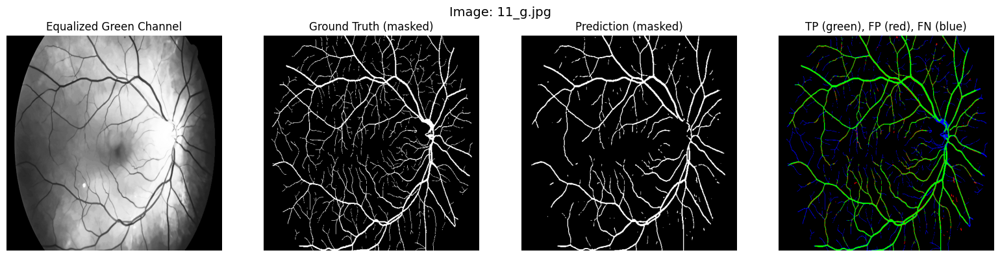

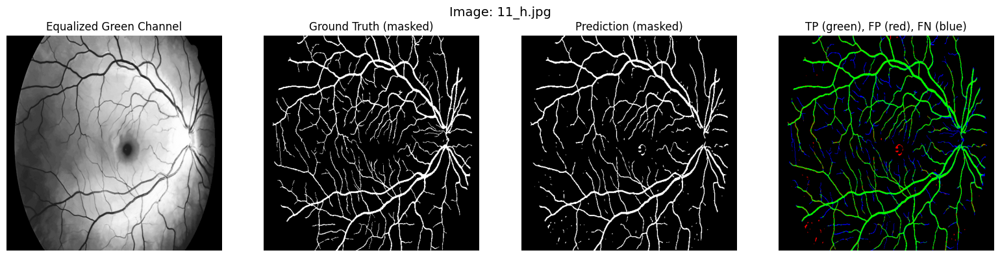

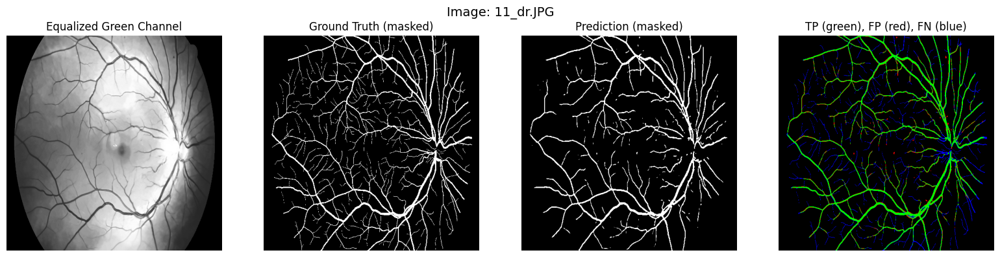

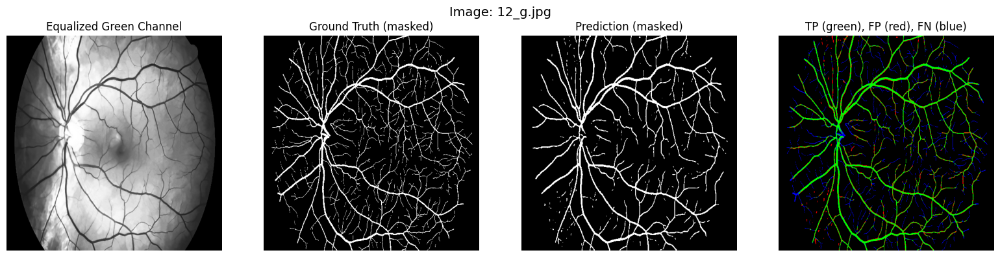

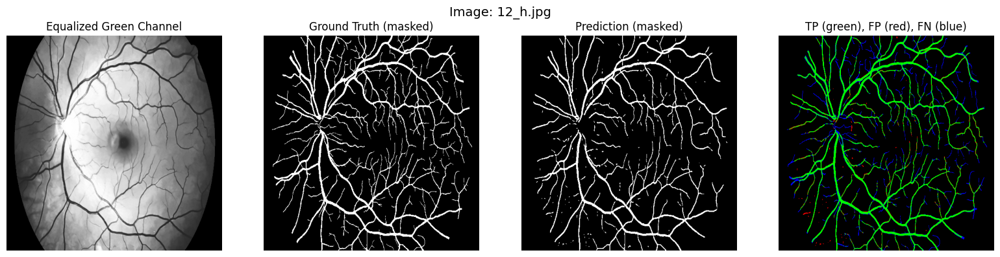

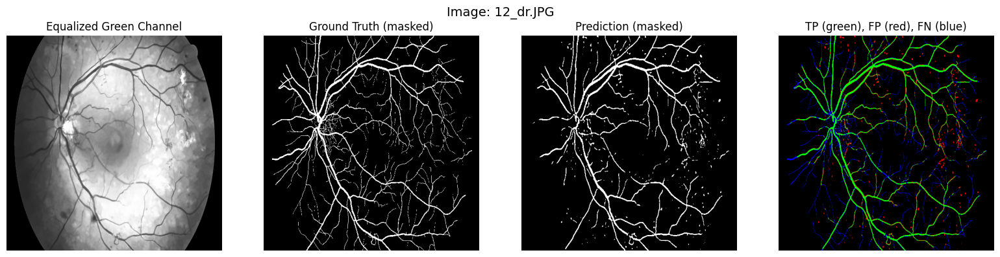

,accuracy,sensitivity,specificity,harmonic_mean,arithmetic_mean,TP,TN,FP,FN,image
0,0.9567,0.6879,0.9830,0.8094,0.8355,16086,234714,4047,7297,11_g.jpg
1,0.9656,0.7658,0.9889,0.8632,0.8773,20909,232228,2613,6394,11_h.jpg
2,0.9545,0.7014,0.9819,0.8183,0.8417,17938,232289,4281,7636,11_dr.JPG
3,0.9515,0.7403,0.9740,0.8412,0.8571,18686,230741,6162,6555,12_g.jpg
4,0.9635,0.7514,0.9913,0.8548,0.8713,22807,229764,2027,7546,12_h.jpg
5,0.9534,0.6504,0.9797,0.7818,0.8151,13612,236322,4894,7316,12_dr.JPG


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:


df_results = visualize_and_evaluate_test_set(test_triplets, model, device)